<a href="https://colab.research.google.com/github/sunbee/FastAI2023/blob/main/BearsWithMe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.3/519.3 kB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 39.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 52.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.9 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
pip install -Uqq fastai duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.5/74.5 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 43.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.6 MB/s eta 0:00:00


In [3]:
from duckduckgo_search import ddg_images
from fastcore.all import *

In [7]:
#hide
from fastbook import *
from fastai.vision.widgets import *

## Acquire Dataset


In [4]:
def search_images(term, max_images=30):
    print(f"Searching for '{term}'")
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

Download 150 images of 'grizzly bear' using DuckDuckGo (DDG) search. Save to folder 'grizzly`. Note that we have used the data-structure `L` and method `itemgot` to collect the URI stashed under key 'image' from each dictionary.

In [5]:
term = 'grizzly bear'
n = 150
grizzly = search_images(term, n)
grizzly[-1]

Searching for 'grizzly bear'


/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:60: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:64: UserWarning: parameter page is deprecated
  warnings.warn("parameter page is deprecated")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:66: UserWarning: parameter max_results is deprecated
  warnings.warn("parameter max_results is deprecated")


'https://tulsazoo.org/wp-content/uploads/2021/01/Grizzly-Thumbnail-1.jpg'

In [28]:
print(f'Got {len(grizzly)} images from search term {term}')

Got 90 images from search term grizzly bear


**Note** It looks like DDG has a limit of 90 on images returned.

Let us open the last image for viewing.
1. Get the last URI.
2. Download image to destination path.
3. Open the image for viewing.

Bote that the default home on Colab is folder `content` which has under it folders `sample_data` and `gdrive` for user's mounted google drive.

In [10]:
??download_url

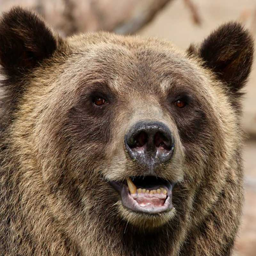

In [13]:
download_url(url = grizzly[-1], dest = "grizzly_sample.jpg", show_progress = False)
GIM = Image.open("grizzly_sample.jpg")
GIM.to_thumb(256, 256)

Now we create a collection.

In [20]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [31]:
path.exists()

True

In [32]:
if not path.exists():
    path.mkdir()
for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    term = f'{o} bear'
    results = search_images(term, 150)
    print(f'Got {len(results)} images from search term {term}')
    download_images(dest, urls=results)

Searching for 'grizzly bear'


/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:60: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:64: UserWarning: parameter page is deprecated
  warnings.warn("parameter page is deprecated")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:66: UserWarning: parameter max_results is deprecated
  warnings.warn("parameter max_results is deprecated")


Got 90 images from search term grizzly bear
Searching for 'black bear'
Got 90 images from search term black bear
Searching for 'teddy bear'
Got 90 images from search term teddy bear


Our folder holds the collection as we expect. DDG has a limit of 90 images.

In [38]:
!pip install nbdev

In [39]:
doc(get_image_files)

In [46]:
bear_collection = get_image_files(path)
print(f'Got {len(bear_collection)} images of bear in collection, e.g. {bear_collection[-1]}!')

Got 257 images of bear in collection, e.g. bears/grizzly/9ddf4ac8-ad47-47df-9a2d-aeec6ca22ab5.jpg!


Now we will remove the corrupted files, i.e. images with broken URIs.

In [44]:
doc(verify_images)

In [45]:
failed = verify_images(bear_collection)
print(f'Got {len(failed)} bad images in set of {len(bear_collection)}!')

Got 7 bad images in set of 257!


We will removethe bad images.

In [47]:
failed.map(Path.unlink)

(#7) [None,None,None,None,None,None,None]

## Clean Dataset

Our strategy is to build the first iteration of a model and note the images that are difficult to classify. These are candidates for elimination to clean the dataset. To begin, we will created data-loader referring to the 7 questions:
- what is the types of your inputs/targets? Here images and categories
- where is your data? Here in filenames in subfolders
- does something need to be applied to inputs? Here no
- does something need to be applied to the target? Here the label_func - function
- how to split the data? Here randomly
- do we need to apply something on formed items? Here a resize
- do we need to apply something on formed batches? Here no

Accordingly, we create the Data Block as follows:

In [50]:
dbl = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms = Resize(128)
)

Now use `DataBlock` to create `DataLoaders`.

In [56]:
dls = dbl.dataloaders(path)

A `DataLoaders` includes validation and training `DataLoaders`. `DataLoaders` is a class that provides batches of a few items at a time to the GPU. We'll learn more about this class in the next chapter. When you loop through a `DataLoaders` fastai will give you 64 (by default) items at a time, all stacked up into a single tensor. We can take a look at a few of those items by calling the `show_batch` method on a `DataLoaders`:

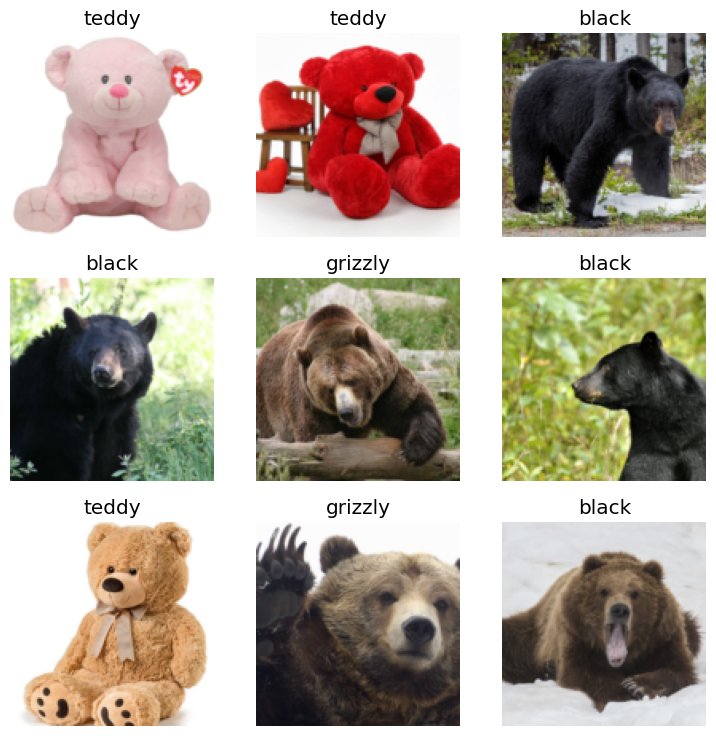

In [57]:
dls.valid.show_batch()

By default Resize crops the images to fit a square shape of the size requested, using the full width or height. This can result in losing some important details. Alternatively, you can ask fastai to pad the images with zeros (black), or squish/stretch them:

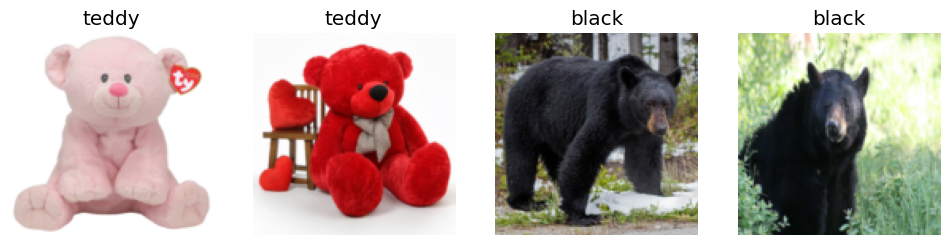

In [58]:
dbl = dbl.new(Resize(size=128, method=ResizeMethod.Squish))
dls = dbl.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

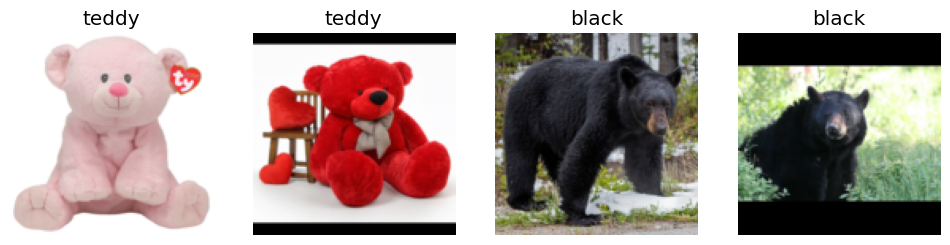

In [60]:
dbl = dbl.new(Resize(size=128, method=ResizeMethod.Pad, pad_mode='zeros'))
dls = dbl.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

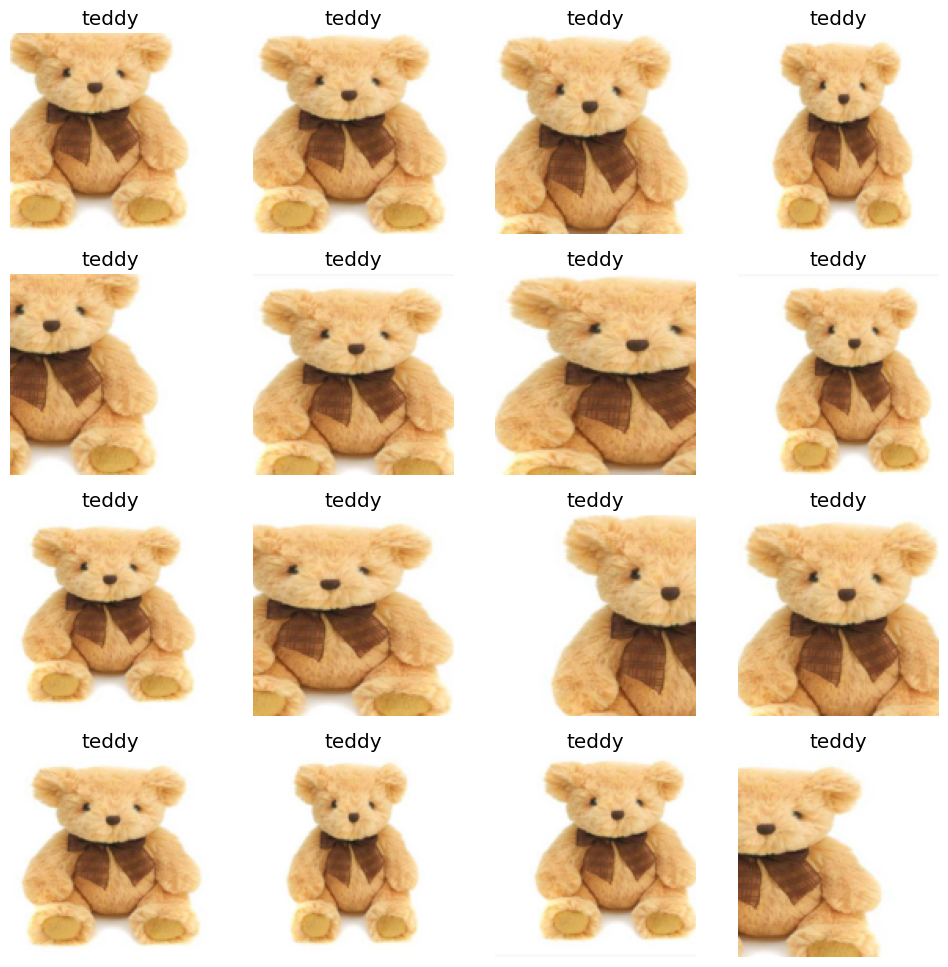

In [63]:
dbl = dbl.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = dbl.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

We don't have a lot of data for our problem (90 pictures of each sort of bear at most), so to train our model, we'll use `RandomResizedCrop` with an image size of 224 px, which is fairly standard for image classification, and default `aug_transforms`:

In [64]:
dbl = dbl.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = dbl.dataloaders(path)

We can now create our Learner and fine-tune it in the usual way:

In [67]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(9)

epoch,train_loss,valid_loss,error_rate,time
0,1.830448,0.470450,0.240000,00:15


epoch,train_loss,valid_loss,error_rate,time
0,0.388060,0.204922,0.060000,00:13
1,0.265795,0.196009,0.020000,00:13
2,0.191575,0.248297,0.020000,00:14
3,0.142782,0.288728,0.020000,00:14
4,0.121879,0.313318,0.020000,00:13
5,0.101404,0.323220,0.020000,00:13
6,0.084983,0.326553,0.020000,00:13
7,0.072496,0.327744,0.020000,00:12
8,0.066416,0.326196,0.020000,00:12


Now let's see whether the mistakes the model is making are mainly thinking that grizzlies are teddies (that would be bad for safety!), or that grizzlies are black bears, or something else. To visualize this, we can create a confusion matrix:

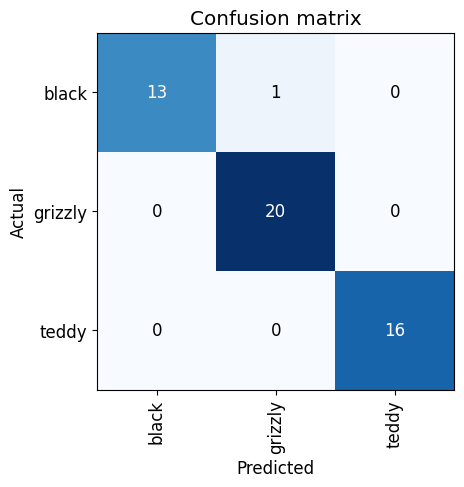

In [79]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The rows represent all the black, grizzly, and teddy bears in our dataset, respectively. The columns represent the images which the model predicted as black, grizzly, and teddy bears, respectively. Therefore, the diagonal of the matrix shows the images which were classified correctly, and the off-diagonal cells represent those which were classified incorrectly. This is one of the many ways that fastai allows you to view the results of your model. It is (of course!) calculated using the validation set. With the color-coding, the goal is to have white everywhere except the diagonal, where we want dark blue. Our bear classifier isn't making many mistakes!

It's helpful to see where exactly our errors are occurring, to see whether they're due to a dataset problem (e.g., images that aren't bears at all, or are labeled incorrectly, etc.), or a model problem (perhaps it isn't handling images taken with unusual lighting, or from a different angle, etc.). To do this, we can sort our images by their loss.

The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer. In a couple of chapters we'll learn in depth how loss is calculated and used in the training process. For now, plot_top_losses shows us the images with the highest loss in our dataset. As the title of the output says, each image is labeled with four things: prediction, actual (target label), loss, and probability. The probability here is the confidence level, from zero to one, that the model has assigned to its prediction:

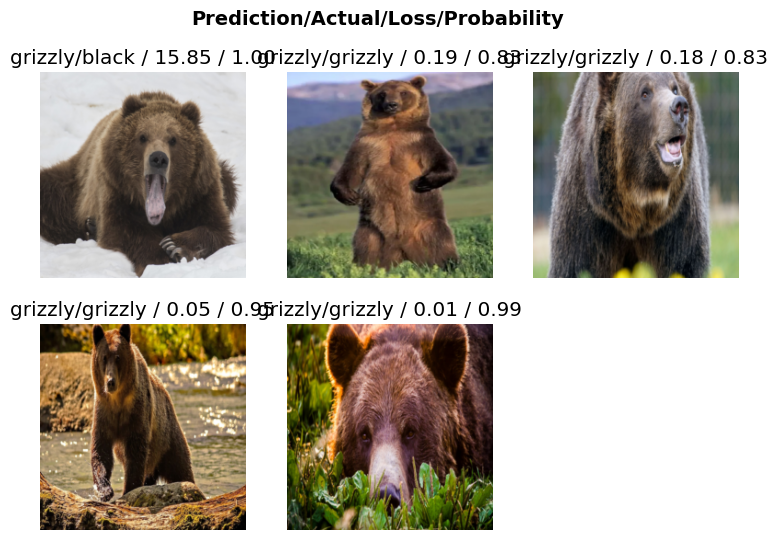

In [80]:
interp.plot_top_losses(5, nrows=2)

This output shows that the image with the highest loss is one that has been predicted as "grizzly" with high confidence. However, it's labeled (based on our image search) as "black." We're not bear experts, but it sure looks to us like this label is incorrect! We should probably change its label to "grizzly."

The intuitive approach to doing data cleaning is to do it before you train a model. But as you've seen in this case, a model can actually help you find data issues more quickly and easily. So, we normally prefer to train a quick and simple model first, and then use it to help us with data cleaning.

fastai includes a handy GUI for data cleaning called ImageClassifierCleaner that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling:

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

The cleaner revealed problems in the collection of teddy bears. Two items were image placeholders (not actual images of teddy bear) and one image was a kid dressed as a teddy bear. I removed these images. I also found one case of a hand-drawn teddy bear and left it in the collection.

I did not find cause for major concern in other categories. The confusion matrix shows one case of black bear misclassified as grizzly bear. That bear appears to belong to the collection of grizzly bears and should be relabeled. Being no expert on bears, I removed that bear from the collection instead of relabeling it. *TODO!*

**Warning!** After running the below commands to remove/relabel images, do not re-run the `ImageClassifierCleaner()` above.

In [77]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

## Train Model

We have completed one iteration of training with the express goal of cleaning our dataset. We identified and removed images unsuitable for training.

In [82]:
dbl = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms = Resize(128)
)

In [83]:
dls = dbl.dataloaders(path)

In [84]:
dbl = dbl.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = dbl.dataloaders(path)

In [85]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(9)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.352888,0.155022,0.040816,00:12


epoch,train_loss,valid_loss,error_rate,time
0,0.320327,0.073153,0.020408,00:11
1,0.231913,0.045197,0.020408,00:13
2,0.176629,0.049154,0.020408,00:14
3,0.148397,0.034074,0.020408,00:13
4,0.123943,0.030910,0.020408,00:13
5,0.109873,0.039961,0.020408,00:12
6,0.094313,0.043982,0.020408,00:12
7,0.082565,0.042004,0.020408,00:14
8,0.071373,0.039015,0.020408,00:14


The model performance is vastly better with the changes we have made. Look at the validation loss, it has improved from 0.3 to 0.03 - an order of magnitude improvement!

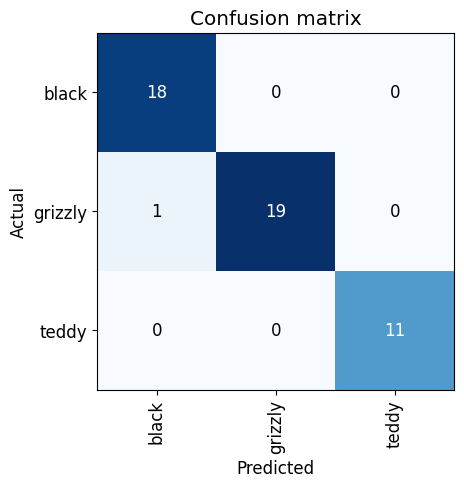

In [86]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The looks good, with only 1 miss. Let us examine further.

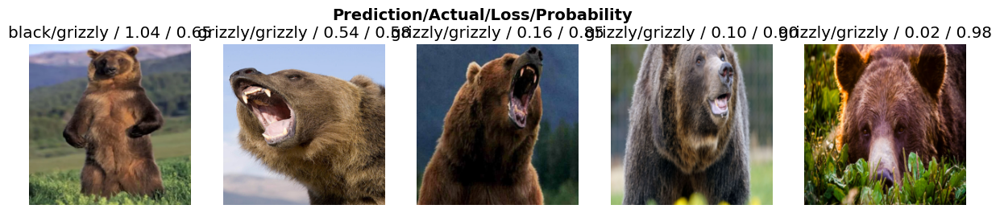

In [97]:
interp.plot_top_losses(5, nrows=1)

In [95]:
doc(ClassificationInterpretation)

In [98]:
doc(ImageClassifierCleaner)

We will take one closer look.

In [99]:
cleaner = ImageClassifierCleaner(learn)
cleaner

I found one grizzly bear among the black bears and proceeded to relabel.

In [103]:
cleaner.change()

(#1) [(18, 'grizzly')]

In [104]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Let's proceed to one more iteration with this change.

In [105]:
dbl = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

In [106]:
dls = dbl.dataloaders(path)

In [107]:
doc(vision_learner)

In [108]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(21)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.370565,0.252787,0.102041,00:14


epoch,train_loss,valid_loss,error_rate,time
0,0.277830,0.159918,0.061225,00:14
1,0.220853,0.075779,0.020408,00:13
2,0.181221,0.047798,0.020408,00:13
3,0.144955,0.034858,0.020408,00:13
4,0.126884,0.028944,0.000000,00:13
5,0.113567,0.026471,0.000000,00:14
6,0.100604,0.031683,0.020408,00:14
7,0.085734,0.032157,0.020408,00:14
8,0.074499,0.023504,0.000000,00:14
9,0.066168,0.013452,0.000000,00:13


That model appears near perfect at classification. Somewhat surprisingly, the validation error is lower than the training error and both decrease monotonically. This differs from the expectation that:
1. training error is less than validation error
2. training error decreases monotonically
3. validation error decreases and then increases with over-fitting

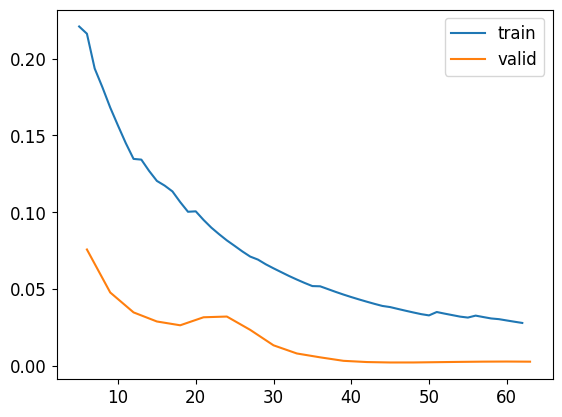

In [109]:
learn.recorder.plot_loss()

## Predict

1.   List item

1.   List item

1.   List item

> Indented block

> Indented block




2.   List item


2.   List item


2.   List item



## Pickle